##### Purpose of the notebook ####

In [1]:
import os
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt

# Read adata

In [2]:
saving_path='/media/sergio/Ymir/5kovarian_for_cnv/figures'
adata=sc.read('/media/sergio/Ymir/5kovarian_for_cnv/adata_annotated.h5ad')

# CNV inference (regular)

In [3]:
adata.X=adata.layers['raw']

In [5]:
import warnings
import numpy as np
from scipy.sparse import csr_matrix, issparse
from scvelo import logging as logg
from scvelo import settings
from scvelo.preprocessing.neighbors import get_connectivities, get_n_neighs, neighbors, verify_neighbors
from scvelo.preprocessing.utils import normalize_per_cell, not_yet_normalized


def moments(data,n_neighbors=20,
    n_pcs=None,mode="connectivities",
    method="umap",use_rep=None,
    use_highly_variable=True,copy=False):
    """Computes moments for velocity estimation.

    First-/second-order moments are computed for each cell across its nearest neighbors,
    where the neighbor graph is obtained from euclidean distances in PCA space.

    Arguments:
    ---------
    data: :class:`~anndata.AnnData`
        Annotated data matrix.
    n_neighbors: `int` (default: 30)
        Number of neighbors to use.
    n_pcs: `int` (default: None)
        Number of principal components to use.
        If not specified, the full space is used of a pre-computed PCA,
        or 30 components are used when PCA is computed internally.
    mode: `'connectivities'` or `'distances'`  (default: `'connectivities'`)
        Distance metric to use for moment computation.
    method : {{'umap', 'hnsw', 'sklearn', `None`}}  (default: `'umap'`)
        Method to compute neighbors, only differs in runtime.
        Connectivities are computed with adaptive kernel width as proposed in
        Haghverdi et al. 2016 (https://doi.org/10.1038/nmeth.3971).
    use_rep : `None`, `'X'` or any key for `.obsm` (default: None)
        Use the indicated representation. If `None`, the representation is chosen
        automatically: for .n_vars < 50, .X is used, otherwise ‘X_pca’ is used.
    use_highly_variable: `bool` (default: True)
        Whether to use highly variable genes only, stored in .var['highly_variable'].
    copy: `bool` (default: `False`)
        Return a copy instead of writing to adata.

    Returns
    -------
    Ms: `.layers`
        dense matrix with first order moments of spliced counts.
    Mu: `.layers`
        dense matrix with first order moments of unspliced counts.
    """
    adata = data.copy() if copy else data

    layers = [layer for layer in {"raw"} if layer in adata.layers]
    if any([not_yet_normalized(adata.layers[layer]) for layer in layers]):
        normalize_per_cell(adata)

    #if n_neighbors is not None and n_neighbors > get_n_neighs(adata):
    neighbors(adata,n_neighbors=n_neighbors,use_rep=use_rep,use_highly_variable=use_highly_variable,n_pcs=n_pcs,method=method,)
    verify_neighbors(adata)

    if "spliced" not in adata.layers.keys() or "unspliced" not in adata.layers.keys():
        logg.info(f"computing moments based on {mode}", r=True)
        connectivities = get_connectivities(
            adata, mode, n_neighbors=n_neighbors, recurse_neighbors=False
        )
        adata.layers["M"] = (
            csr_matrix.dot(connectivities, csr_matrix(adata.layers["raw"]))
            .astype(np.float32)
            .toarray()
        )
    return adata if copy else None

In [6]:
moments(adata,n_neighbors=100)

Normalized count data: X.


AttributeError: 'csr_matrix' object has no attribute 'A'

In [ ]:
adata.write('/media/sergio/Ymir/5kovarian_for_cnv/adata_annotated_moments_neighbors_100.h5ad')

# Code with infercnv (change kernel to infercnv)

In [1]:
import os
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
import infercnvpy as cnv

/home/sergio/.local/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
adata=sc.read('/media/sergio/Ymir/5kovarian_for_cnv/adata_annotated_moments_neighbors_100.h5ad')

In [55]:
adata.X=adata.layers['raw']

In [56]:
cnv.tl.infercnv(adata,reference_key="cell class",
reference_cat=['Monocytes','B cells','T cells','Endothelial','Low expression','Fibroblasts'],window_size=60,layer='M')

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████| 232/232 [02:43<00:00,  1.42it/s]


categories: B cells, Endothelial, Epithelial, etc.
var_group_labels: chr1, chr2, chr3, etc.


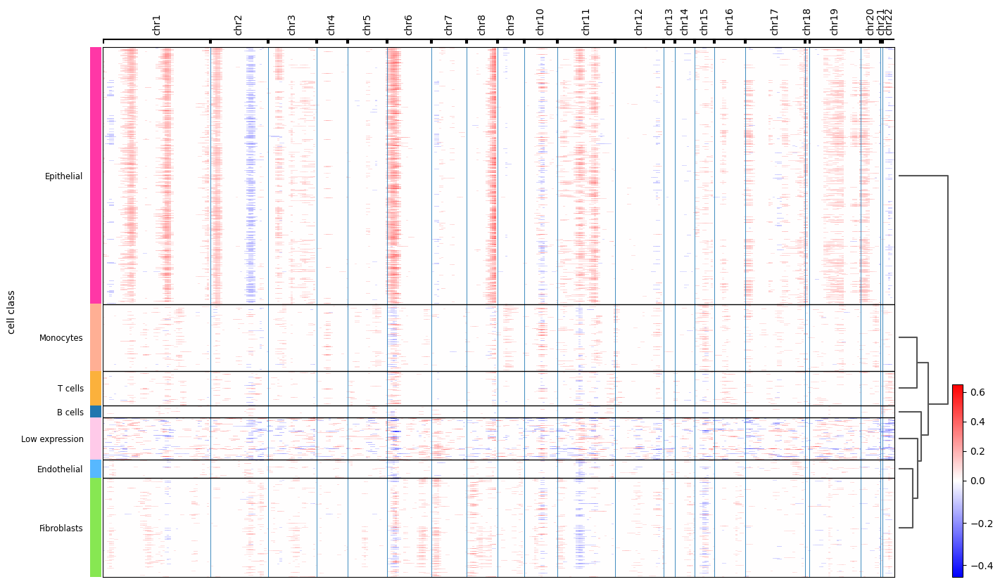

In [6]:
cnv.pl.chromosome_heatmap(adata, groupby="cell class",dendrogram=True)

In [ ]:
cnv.tl.pca(adata)
cnv.pp.neighbors(adata)

In [ ]:
cnv.tl.leiden(adata,resolution=0.7)
sc.tl.dendrogram(adata,groupby='cnv_leiden')
sc.pl.dendrogram(adata,groupby='cnv_leiden')

In [12]:
saving_path='/media/sergio/Ymir/5kovarian_for_cnv/figures'

categories: 0, 1, 2, etc.
var_group_labels: chr1, chr2, chr3, etc.


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:FFTM dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'MATH': 26 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', '.null', 'c', 'd', 'e', 'eight', 'five', 'four', 'h', 'i', 'l', 'minus', 'n', 'nine', 'nonmarkingreturn', 'one', 'period', 'r', 'seven', 'six', 'space', 'three', 'two', 'underscore', 'v', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 66, 70, 71, 72, 75, 76, 79, 81, 85, 89, 3228]
INFO:fontTools.subset:Closed glyph list over 'MATH': 26 glyphs after
INFO:fontTools.subset:Glyph names: ['.notdef', '.null', 'c', 'd', 'e', 'eight', 'five', 'four', 'h', 'i', 

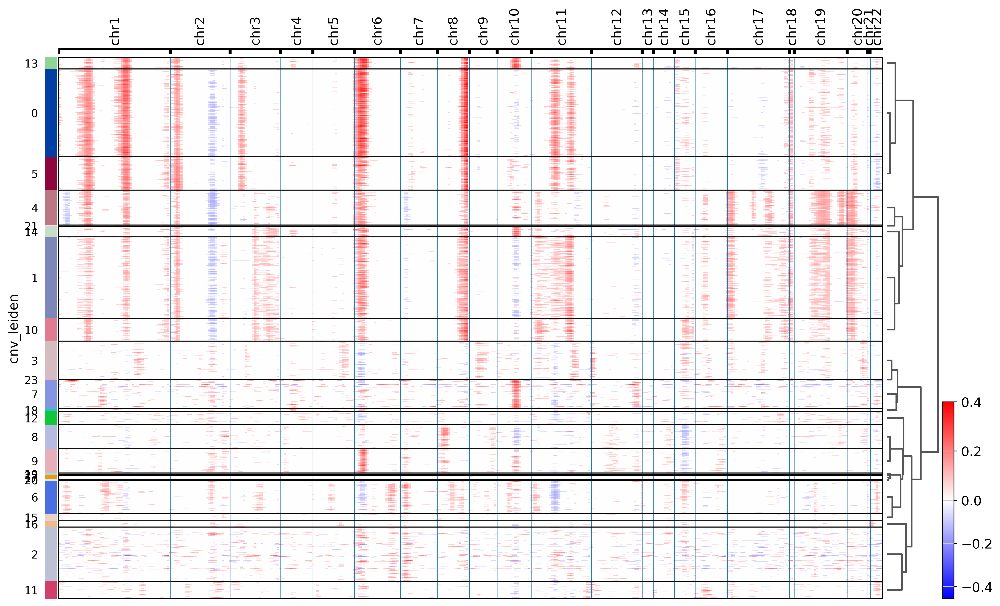

In [13]:
import matplotlib
sc.set_figure_params(scanpy=True, dpi=200, dpi_save=200, frameon=False, vector_friendly=True, fontsize=13, figsize=(5,5), color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
cnv.pl.chromosome_heatmap(adata, groupby="cnv_leiden",dendrogram=True,vmax=0.4,show=False)
plt.savefig(saving_path+'/heatmap_cnv_leiden_moments.pdf')

In [ ]:
import matplotlib
sc.set_figure_params(scanpy=True, dpi=200, dpi_save=200, frameon=False, vector_friendly=True, fontsize=13, figsize=(5,5), color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
cnv.pl.chromosome_heatmap_summary(adata, groupby="cnv_leiden",dendrogram=True,vmax=0.4,show=False)
plt.savefig(saving_path+'/heatmap_summary_cnv_leiden_moments.pdf')

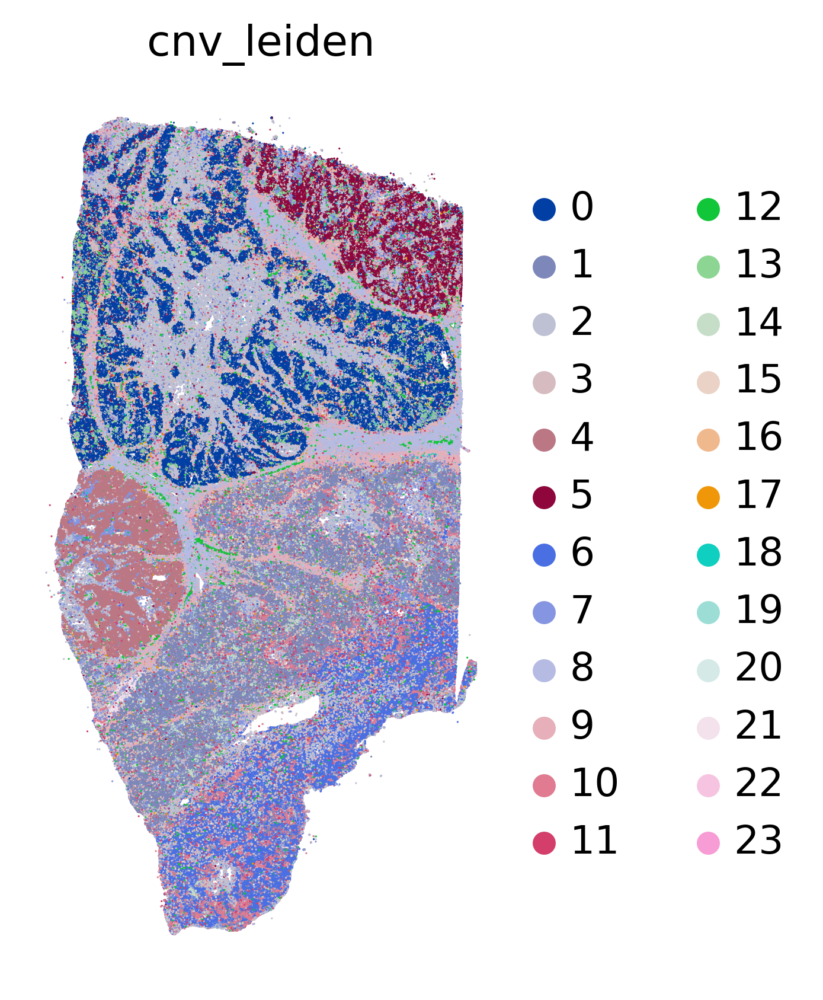

<Figure size 1000x1000 with 0 Axes>

In [14]:
import matplotlib
sc.set_figure_params(scanpy=True, dpi=200, dpi_save=200, frameon=False, vector_friendly=True, fontsize=13, figsize=(5,5), color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
sc.pl.spatial(adata,color='cnv_leiden',spot_size=50,frameon=False)
plt.savefig(saving_path+'/spatial_cnv_leiden_moments.pdf')

In [15]:
saving_path='/media/sergio/Ymir/5kovarian_for_cnv/figures'
adata.write('/media/sergio/Ymir/5kovarian_for_cnv/adata_moments_cnvinfered.h5ad')

In [20]:
adata.obs['x']=[a[0] for a in adata.obsm['spatial']]
adata.obs['y']=[a[1] for a in adata.obsm['spatial']]

In [23]:
adata.obs.loc[:,['x','y','cnv_leiden','cell class','leiden']].to_csv('/media/sergio/Ymir/5kovarian_for_cnv/adata_obs.csv')

# Cell type vs CNV inference

<Axes: xlabel='cnv_leiden'>

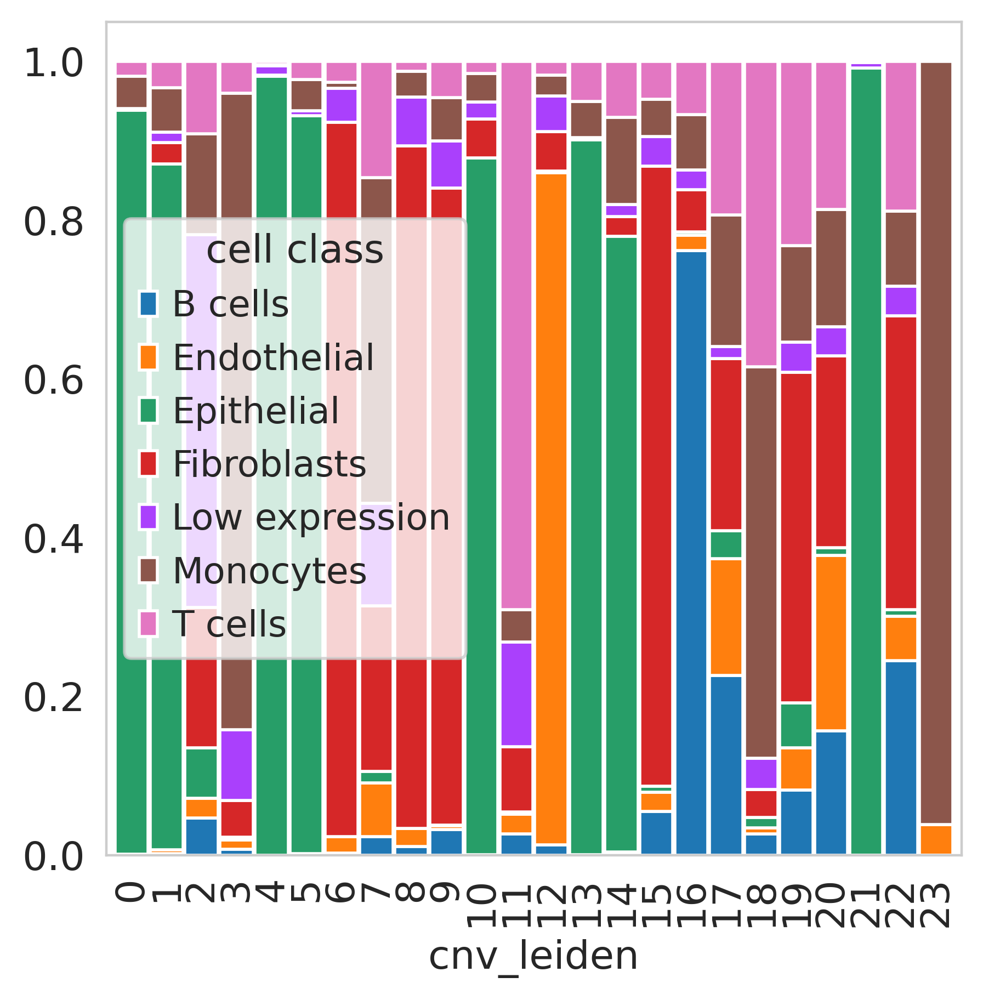

In [40]:
sns.set_style("whitegrid", {'axes.grid' : False})
exrn=pd.crosstab(adata.obs['cnv_leiden'],adata.obs['cell class'])
exrn=exrn.div(exrn.sum(axis=1),axis=0)
exrn.plot(kind='bar',stacked=True,width=0.95)
#sns.clustermap(exrn)

In [78]:
cnv.tl.cnv_score(adata,use_rep='cnv_pca')

In [82]:
adata.obs['computed_cnv_score']=np.sum(np.abs(adata.obsm['X_cnv_pca']),axis=1)

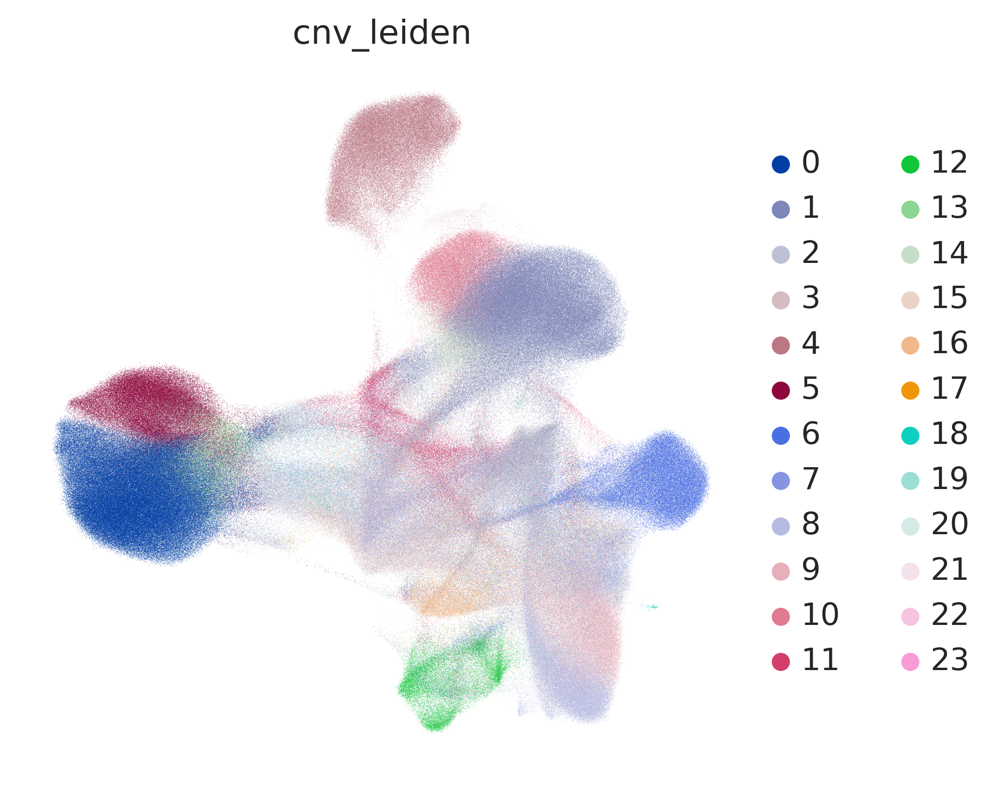

In [87]:
sc.pl.umap(adata,color='cnv_leiden',cmap='coolwarm',vmax=5)

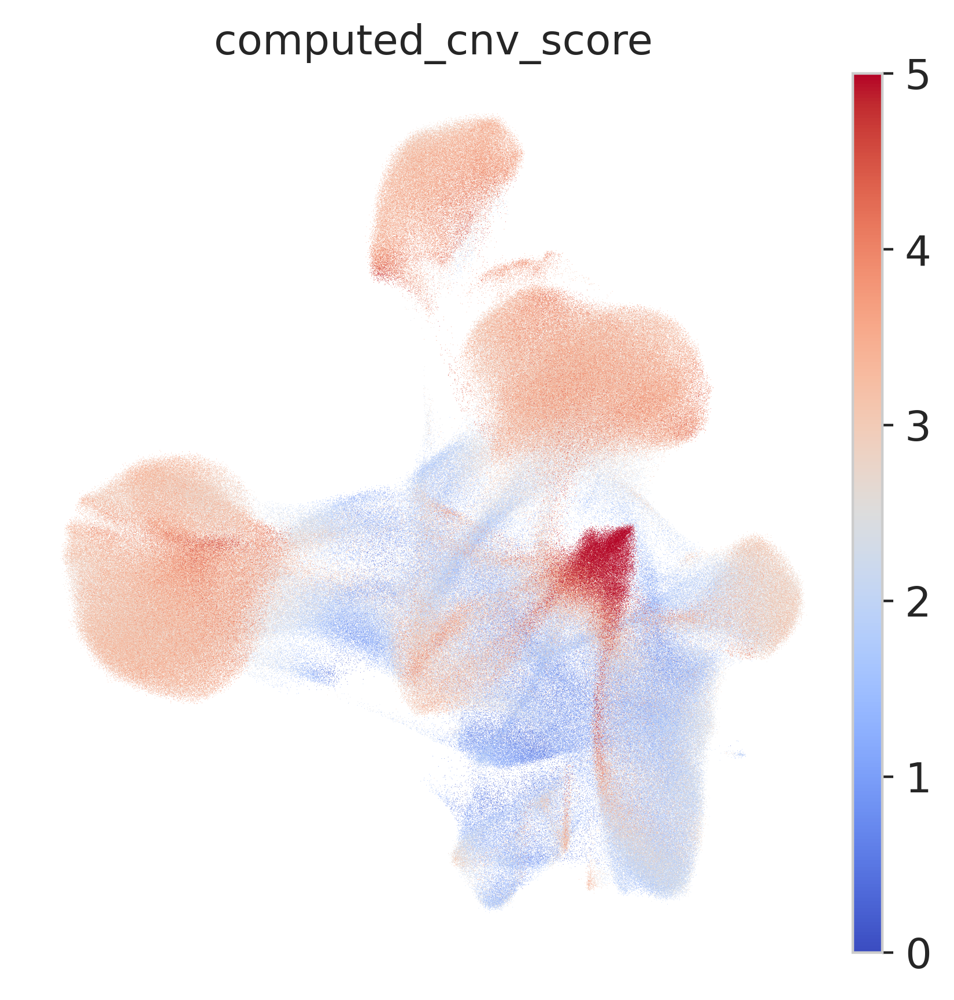

In [84]:
sc.pl.umap(adata,color='computed_cnv_score',cmap='coolwarm',vmax=5)

In [ ]:
sc.pl.dotplot(adata,['cnv_score'],groupby='cell class')

In [ ]:
leiden_vs_cnv=pd.crosstab(adata.obs['leiden'],adata.obs['cnv_leiden'])
sns.clustermap(leiden_vs_cnv,standard_scale='obs')

In [41]:
# Copykat

# VERY RELEVANT 
TAP1, TAP2 and CFB are all present in the same locus. (6p21.3) -Interferon

While the same occurs for IFIT1 and IFIT3 (10q23.31) - MHC

GATA4 and SFRP1 are located in 8p and could also generate the CNV we observe in cnv cluster 8

In [ ]:
sc.tl.rank_genes_groups(adata,groupby='cnv_leiden')

In [ ]:
sc.pl.rank_genes_groups(adata,groupby='cnv_leiden')